Using Hierarchical Clustering to organize and explore modern and ancient DNA data using G25 coordinates

In [1]:
require(rio)
require(tidyverse)
require(ggthemes)
require(pvclust)
require(ggdendro)
require(geomtextpath)

Loading required package: ggthemes

Loading required package: pvclust

Loading required package: ggdendro

Loading required package: geomtextpath



Load the data

In [2]:
myd = import("~/Documents/Ancestry/Genetics/G25/Data/TXT/By Age/Ancient_sampled.txt",fill = TRUE)
myd = myd %>% bind_rows(import("~/Documents/Ancestry/Genetics/G25/Data/TXT/By Age/Modern_Eurasia_sampled.txt",fill = TRUE))

In [4]:
myd %>% sample_n(15)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Greek_Crete:B_Crete-1,0.112685,0.138112,-0.008674,-0.040698,0.004616,-0.011992,-0.000705,-0.005307,-0.000614,⋯,0.005569,0.016168,0.006461,0.006913,-0.004627,0.002121,0.001484,-0.008751,-0.004217,-0.000359
Greek_Argolis:ARGO-19,0.121791,0.133034,0.004148,-0.023902,0.016926,-0.001394,0.002115,-0.001846,-0.006545,⋯,0.012198,0.017863,0.005321,0.008422,-0.007128,-0.007986,0.000989,-0.003451,0.007350,-0.008382
Spain_SE_Iberia_BA_Valencian:LHO003,0.129758,0.154360,0.059208,0.011628,0.063704,-0.011435,-0.002820,0.003461,0.044586,⋯,0.012066,0.018384,-0.002914,-0.001383,0.005503,0.005865,0.005441,-0.010106,-0.026751,0.007784
Greek_West_Taygetos:MMA-26,0.117238,0.139128,0.009428,-0.020995,0.023081,-0.005578,0.008695,-0.002077,-0.006340,⋯,0.003845,0.010170,-0.000887,0.006662,-0.003877,-0.004367,0.001607,0.005300,0.004097,0.000838
Azerbaijani_Dagestan:AZR-0865,0.096750,0.097491,-0.052043,-0.029393,-0.041546,0.005578,0.010105,-0.009230,-0.023929,⋯,-0.004375,-0.011083,0.003927,0.000754,-0.006753,-0.003119,0.005317,-0.000493,-0.007109,-0.003233
Albanian:ALB220,0.109270,0.147252,0.013953,-0.021641,0.023697,-0.009761,0.006345,0.005769,-0.005522,⋯,0.003447,0.013299,-0.004054,0.014330,-0.001251,-0.008235,0.002349,0.003328,0.006145,0.001078
German_Erlangen:GSM1658634,0.130897,0.134050,0.057699,0.042959,0.033545,0.021753,-0.004465,0.002538,0.001841,⋯,0.001856,0.008345,-0.003801,0.003771,0.003752,0.002121,-0.005317,-0.006162,-0.006868,-0.000479
Serbian:726,0.126344,0.136081,0.038843,0.010982,0.035083,-0.000558,0.000705,0.008538,-0.005931,⋯,0.006364,0.005998,0.009755,0.005405,0.002626,-0.005865,-0.002968,0.004314,-0.000723,-0.001796
Cossack_Ukrainian:GS000035238,0.135449,0.116786,0.071653,0.060078,0.033852,0.023148,0.011281,0.010615,0.003068,⋯,0.001989,0.000391,0.005194,0.003520,0.003377,-0.009608,-0.002349,0.004067,-0.006868,0.000599


Denormalize the sample identifiers

In [5]:
myd = myd %>% mutate(loc = str_extract(V1,"^\\w+?(?=_)"),
                     era = str_extract(V1,"(?<=_)\\w[^_]+?(?=[:.])"),
                     sample = str_extract(V1,"(?<=:)\\w+?(?=(_|\\.|$))"),
                     desc = paste(loc,era,sep = '_'),.before = V1)

In [6]:
myd %>% select(loc,era,sample,desc,V1) %>% sample_n(15)

loc,era,sample,desc,V1
<chr>,<chr>,<chr>,<chr>,<chr>
England,Saxon,I20646,England_Saxon,England_EarlyMedieval_Saxon:I20646
Sweden,Viking,VK355,Sweden_Viking,Sweden_Viking.SG:VK355_noUDG.SG
French,Occitanie,T,French_Occitanie,French_Occitanie:T_11
NA,NA,NA,NA_NA,Vepsian:KAR-190
Russia,Catacomb,RK4002,Russia_Catacomb,Russia_Steppe_Catacomb:RK4002
Russian,Kursk,RussianKursk18,Russian_Kursk,Russian_Kursk:RussianKursk18
Germany,EarlyMedieval,NW255a,Germany_EarlyMedieval,Germany_EarlyMedieval.SG:NW255a_noUDG.SG
NA,NA,Polish18,NA_NA,Polish:Polish18
Italy,EarlyModern,R58,Italy_EarlyModern,Italy_Medieval_EarlyModern.SG:R58.SG


Summarize and transpose

In [7]:
mydd = t(myd %>% select(-loc,-era,-sample,-V1) %>% group_by(desc) %>% summarize_all(median))

In [8]:
mydd = as_tibble(mydd)
colnames(mydd) = mydd[1,]
mydd %>% sample_n(10)

Warning message:
“The `x` argument of `as_tibble.matrix()` must have unique column names if
`.name_repair` is omitted as of tibble 2.0.0.
ℹ Using compatibility `.name_repair`.”


ALB_PostMA,ARM_Beniamin,ARM_EIA,ARM_LBA,ARM_LBA-EIA,ARM_MBA,AUS_112BP,AUT_Wels,Abkhasian_Gudauta,Albania_Modern,⋯,Ukrainian_Chernihiv,Ukrainian_Dnipro,Ukrainian_Lviv,Ukrainian_NA,Ukrainian_Rivne,Ukrainian_Sumy,Ukrainian_Zakarpattia,Ukrainian_Zhytomyr,Uppland_VA,Uppsala_VA
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
0.0085065,-0.0156175,0.0075300,0.0000000,-0.0009765,-0.0064140,-0.3360630,-0.0019520,-0.0058565,-0.0039040,⋯,0.0251000,0.0209170,0.0191040,-0.0161760,0.0209170,0.0242635,0.0170120,0.0211960,0.0220320,0.0298410
0.0044370,0.0060395,0.0035740,-0.0052380,0.0009860,0.0097370,0.0044370,-0.0020950,0.0037590,0.0034510,⋯,0.0087510,0.0041900,0.0032045,0.0085040,0.0053000,0.0050530,0.0036970,0.0044370,-0.0002460,0.0019720
0.0025140,-0.0028285,0.0033310,-0.0021995,-0.0022000,0.0038970,0.0035200,-0.0061590,-0.0103075,0.0008800,⋯,0.0026400,0.0032680,0.0039595,0.0035200,0.0040220,0.0040850,0.0017600,0.0040220,0.0070390,0.0084220
0.0196815,-0.0128475,-0.0236905,-0.0193170,-0.0203195,-0.0169480,-0.0061960,0.0156720,-0.0232350,0.0058320,⋯,-0.0244200,-0.0280640,-0.0142145,0.0116630,-0.0224150,-0.0224150,-0.0112990,-0.0264240,-0.0107520,-0.0030980
-0.0013490,0.0044960,0.0055450,0.0017985,0.0020235,-0.0040460,-0.0019480,0.0049460,0.0133380,0.0046460,⋯,-0.0074930,-0.0092920,-0.0060695,0.0010490,-0.0074930,-0.0097415,-0.0076430,-0.0110900,-0.0089920,-0.0059950
-0.0152685,-0.0046820,0.0057005,0.0070575,0.0057005,0.0122150,-0.0038000,0.0054290,0.0082110,-0.0158790,⋯,-0.0128930,-0.0093650,-0.0111290,-0.0020360,-0.0135720,-0.0112650,-0.0114010,-0.0093650,0.0152010,0.0080070
0.0051150,0.0002435,0.0057645,0.0029230,0.0042220,0.0077950,-0.0100680,-0.0034100,0.0030850,0.0035730,⋯,-0.0035730,-0.0021110,-0.0060085,-0.0008120,-0.0030850,-0.0030045,-0.0019490,-0.0022730,-0.0074700,-0.0061710
0.0053020,-0.0020485,-0.0046990,0.0019885,0.0056635,0.0056630,-0.0031330,0.0087960,-0.0051210,-0.0027710,⋯,-0.0057840,-0.0048200,-0.0036750,-0.0007230,-0.0051810,-0.0095190,-0.0008430,-0.0036150,0.0034940,0.0120500
0.0028245,-0.0022300,-0.0032705,-0.0047575,-0.0052775,-0.0004460,0.0081760,-0.0123390,-0.0266105,0.0041620,⋯,0.0162040,0.0185830,0.0111500,0.0007430,0.0126360,0.0147175,0.0086220,0.0136770,0.0011890,0.0013380


Run clustering

In [9]:
myfit = pvclust(mydd[2:nrow(mydd),],method.hclust = "complete",method.dist = "euclidean",nboot = 1)

Bootstrap (r = 0.48)... Done.
Bootstrap (r = 0.6)... Done.
Bootstrap (r = 0.68)... Done.
Bootstrap (r = 0.8)... Done.
Bootstrap (r = 0.88)... Done.
Bootstrap (r = 1.0)... Done.
Bootstrap (r = 1.08)... Done.
Bootstrap (r = 1.2)... Done.
Bootstrap (r = 1.28)... Done.
Bootstrap (r = 1.4)... Done.


Pull out the dendrogram data

In [10]:
ddata = dendro_data(myfit$hclust,type = "rectangle",uniform = TRUE,compress = TRUE)

In [11]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 400)

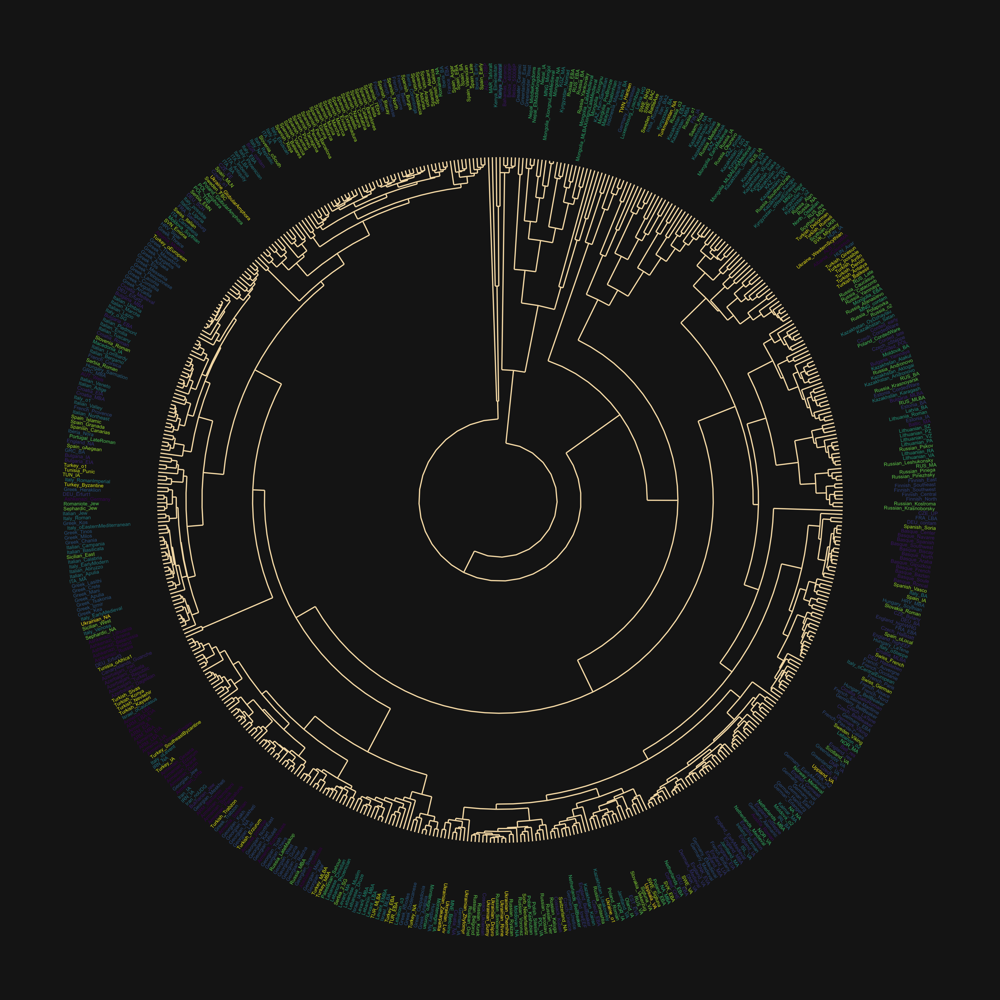

In [12]:
sdata = segment(ddata)
ldata = label(ddata)
p = ggplot(sdata) + 
    geom_segment(aes(x = x,y = y,xend = xend,yend = yend),color = "wheat") + 
    geom_textvline(data = ldata,aes(xintercept = x,label = label,color = as.factor(str_extract(label,'^\\w+?(?=_)'))),size = 1.5,linetype = 0,hjust = 1.1) + 
    scale_y_reverse(expand = c(0.2, 0)) + 
    coord_curvedpolar() + 
    theme_void()
p + guides(color = "none") + scale_color_viridis_d(option = "D") + theme(plot.background = element_rect(fill = "gray10",color = "gray10"),plot.margin = margin(0,0,0,0,"cm"))

Adding Y and mtDNA etc

In [13]:
ydata = as_tibble(import("~/Documents/Ancestry/Raw Data/Archeological Samples/aDNA-Y-mt/all-ancient-dna.xlsx"))

Warning message:
“Expecting numeric in AA1070 / R1070C27: got '...'”
Warning message:
“Expecting numeric in AA1476 / R1476C27: got '...'”
Warning message:
“Expecting numeric in AA1477 / R1477C27: got '...'”
Warning message:
“Expecting numeric in AO2887 / R2887C41: got '..'”
Warning message:
“Expecting numeric in AA4167 / R4167C27: got '...'”
Warning message:
“Expecting numeric in AO5085 / R5085C41: got '..'”
Warning message:
“Coercing text to numeric in AO7537 / R7537C41: '0.088'”
Warning message:
“Expecting numeric in AO8135 / R8135C41: got '..'”
Warning message:
“Expecting numeric in AO8222 / R8222C41: got '..'”
Warning message:
“Expecting numeric in AO8246 / R8246C41: got '..'”
Warning message:
“Expecting numeric in AO11704 / R11704C41: got '..'”
Warning message:
“Expecting numeric in AO11886 / R11886C41: got '..'”
Warning message:
“Coercing text to numeric in AO14505 / R14505C41: '0.778'”


In [14]:
ydata %>% sample_n(10)

Object-ID,Colloquial-Skeletal,Latitude,Longitude,Sex,mtDNA-coverage,mtFAR,mtDNA-haplogroup,mtDNA-Haplotree,mt-FTDNA,⋯,Location,SiteID,Country,LP,Skin,Hair,Eye,P1104A,Other,Index
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>
Ramesses_III,Ramesses III,25.73989,32.607778,M,NA,NA,NA,NA,NA,⋯,"KV11, Valley of the Kings",NA,Egypt,NA,NA,NA,NA,NA,NA,1521
I3342,R08,30.26210,79.731719,M,767,0.0356471,M3a2,M3a2,https://www.familytreedna.com/public/mt-dna-haplotree/M;name=M3a2,⋯,Roopkund Lake,NA,India,NA,NA,NA,NA,NA,NA,8000
JAG001,AT-878,47.81308,108.531944,M,NA,0.7116232,F1b1f,F1b1f,https://www.familytreedna.com/public/mt-dna-haplotree/F;name=F1b1f,⋯,"Jargalantyn Am (Jargalantyn Khondii), Khentii",Circular grave; Grave 151,Mongolia,NA,NA,NA,NA,NA,NA,11096
Uyelgi8,ULG16,55.84855,61.552110,F,NA,0.2602740,H40b,H40b,https://www.familytreedna.com/public/mt-dna-haplotree/H;name=H40b,⋯,"Uyelgi, Chelyabinsk region",Kurgan 29; Grave 1,Russia,NA,NA,NA,NA,NA,NA,10463
CSP005,"Caspan 6 mound 1, Skull #2",44.49432,78.266442,F,59.487499999999997,0.9771836,T2b4e,T2b4e,https://www.familytreedna.com/public/mt-dna-haplotree/T;name=T2b4e,⋯,"Caspan 6 mound 1, Skull #2",NA,Kazakhstan,NA,NA,NA,NA,NA,NA,14111
NOR3-6,NOR3-6,48.44526,7.671180,F,27,0.3926496,H7d,H7d,https://www.familytreedna.com/public/mt-dna-haplotree/H;name=H7d,⋯,Nordhouse,Nordhouse,France,NA,NA,NA,NA,NA,NA,7663
MJ-19,46,48.80342,30.509367,F,..,0.4851641,H1n6,H1n6,https://www.familytreedna.com/public/mt-dna-haplotree/H;name=H1n6,⋯,Legedzine,Grave 20,Ukraine,NA,NA,NA,NA,NA,NA,8086
AC22,NA,47.06120,19.275400,NA,NA,0.4791743,M7c1b2b,M7c1b2b,https://www.familytreedna.com/public/mt-dna-haplotree/M;name=M7c1b2b,⋯,Kunpeszér,NA,Hungary,NA,NA,NA,NA,NA,NA,10407
I1674,SG21,34.50000,47.960000,M,334,1.0000000,I1c,I1c,https://www.familytreedna.com/public/mt-dna-haplotree/I;name=I1c,⋯,Seh Gabi,NA,Iran,NA,Intermediate,Brown/Dark Brown,Brown,NA,NA,3962


In [15]:
colnames(ydata)

[1] "Object-ID"           "Colloquial-Skeletal" "Latitude"           
 [4] "Longitude"           "Sex"                 "mtDNA-coverage"     
 [7] "mtFAR"               "mtDNA-haplogroup"    "mtDNA-Haplotree"    
[10] "mt-FTDNA"            "mtree"               "mt-YFull"           
[13] "FTDNA-mt-Haplotree"  "mt-Simple"           "mt-Symbol"          
[16] "HVS-I"               "HVS-II"              "HVS-NO"             
[19] "mt-SNPs"             "Responsible-mtDNA"   "Y-DNA"              
[22] "Y-New"               "SNP-positive"        "SNP-negative"       
[25] "SNP-dubious"         "NRY"                 "Y-FAR"              
[28] "Y-Simple"            "YTree"               "Y-Haplotree-Variant"
[31] "Y-Haplotree-Public"  "Y-FTDNA"             "YFull"              
[34] "Y-YFull"             "ISOGG2019"           "FTDNA-Y-Haplotree"  
[37] "Y-Symbol"            "Y-Symbol2"           "Responsible-SNP"    
[40] "SNPs"                "Autosomal-Coverage"  "Damage-Rate"        
[43] "Assessment"          "Kinship-Notes"       "Source"             
[46] "Method-Date"         "Date"                "Mean"               
[49] "CalBC_top"           "CalBC_bot"           "Age"                
[52] "Simplified_Culture"  "Culture_Grouping"    "Label"              
[55] "Location"            "SiteID"              "Country"            
[58] "LP"                  "Skin"                "Hair"               
[61] "Eye"                 "P1104A"              "Other"              
[64] "Index"

In [17]:
ydata %>% select(`Y-Simple`,`YTree`,`YFull`,`ISOGG2019`,`Y-Haplotree-Variant`,`Y-Haplotree-Public`,`Y-Symbol`,`Y-Symbol2`) %>% sample_n(10)

Y-Simple,YTree,YFull,ISOGG2019,Y-Haplotree-Variant,Y-Haplotree-Public,Y-Symbol,Y-Symbol2
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
R1bL23,R1b-L23,R-L23,R1b1a1b1(xR1b1a1b1a1a1c1),R-L23,R-L23,R1b,R1bL23
NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA
Q1bY4276,Q1b-Z35703*,Q-Y4303*,Q1b1a1a2a~..,Q-Z35703,Q-Z35703,Q,Q1b
NA,NA,NA,NA,NA,NA,NA,NA
R1bP312,R1b-P312,R-P312,R1b1a1b1a1a2,R-P312,R-P312,R1b,R1bP312
H2,H2,H-P96,H2,H-P96,H-P96,H,H
NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA


In [18]:
nrow(ydata)
ydata %>% select(`Object-ID`,`Date`,`Mean`,`Simplified_Culture`,`Label`,`Location`,`Country`) %>% sample_n(10)

[1] 15460

Object-ID,Date,Mean,Simplified_Culture,Label,Location,Country
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
G7,1000 AD,1000,Viking,NA,Galgedil,Denmark
I11249,3500-2700 BCE,-3100,Iberia_MLN,Spain_MLN,"Jentillarri, Enirio-Aralar, Gipuzkoa, Basque Country",Spain
SzO/81,600–650/660,645,Avar,Avar_Early,Szegvár-Oromdűlő/81,Hungary
BENZ 18,3101-2919 calBC 1σ (4418 ± 65 BP),-3010,CEU_MN,NA,Benzingerode I,Germany
LICOL93,570-630/640 AD,605,Germanic,Italy_North_EarlyMedieval_Langobards,Collegno,Italy
LJZ–M67–A,3100-1800 BP,-500,China_IA,NA,Jinan_Liujiazhuang site,China
Takasago14,3000-2500 BP,-750,Japan_Jomon,NA,Takasago,Japan
PB1794,"3642-3377 calBCE (4764±54 BP, UBA-39197)",-3536,Ireland_MN,Ireland_MN.SG,"Parknabinnia, Clare",Ireland
JK2974,889-803 cal BC,-846,Egypt_Pre_Ptolemaic,NA,Abusir el-Meleq,Egypt


In [19]:
ydata = ydata %>% select(`Object-ID`,`Mean`,`Simplified_Culture`,`Location`,`Country`,`Y-Symbol`,`YTree`)

In [20]:
myd = myd %>% inner_join(ydata,by = c("sample" = "Object-ID"))

Warning message in inner_join(., ydata, by = c(sample = "Object-ID")):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 356 of `x` matches multiple rows in `y`.
ℹ Row 4282 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”


In [21]:
colnames(myd)
myd %>% select(sample,desc,`Mean`,`Simplified_Culture`,`Location`,`Country`,`Y-Symbol`,`YTree`) %>% sample_n(10)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Simplified_Culture" "Location"          
[34] "Country"            "Y-Symbol"           "YTree"

sample,desc,Mean,Simplified_Culture,Location,Country,Y-Symbol,YTree
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
RISE1166,Poland_GlobularAmphora,-2924,Globular_Amphora,"Koszyce, site 3",Poland,NA,NA
I0984,Russia_Sintashta,-1920,Sintashta,Kamennyi Ambar 5 Cemetery,Russia,R1a,"R1a-Z2124(xF1345;xS23592, etc.)"
VK153,POL_VA,1000,Viking,Bodzia,Poland,R1a,R1a-M198
VK269,SWE_VA,950,Viking,Karda,Sweden,R1b,R1b-M269
R969,Italy_EarlyModern,1650,Italy_Renaissance,Tivoli Palazzo Cianti,Italy,J,J2a-Z28598*
ros005,Sweden_FBC,-3005,Nordic_MN,Rössberga,Sweden,I,I2-pre-S2742
R1286,Italy_oCentralEuropean,1430,Italy_MA,Cancelleria,Italy,I,I1-FT151924
I3600,Germany_BellBeaker,-2225,Bell_Beaker,"Alburg-Lerchenhaid, Spedition Häring, Stkr. Straubing, Bavaria",Germany,NA,NA
I7282,Czech_BellBeaker,-2250,Bell_Beaker,Radovesice,Czech Republic,R1b,R1b-L2


In [22]:
myd = myd %>% mutate(yc = paste(Country,`Y-Symbol`,sep = "_"),y = ifelse(is.na(`Y-Symbol`),'??',`Y-Symbol`))

Automating the process

In [34]:
myfun = function(somedata,size = 3,polar = TRUE,modulo = FALSE) {
    mydd = as_tibble(somedata)
    print(dim(mydd))
    print(mydd %>% head)
    myfit = pvclust(mydd,method.hclust = "complete",method.dist = "euclidean",nboot = 1)
    ddata = dendro_data(myfit$hclust,type = "rectangle",uniform = TRUE,compress = TRUE)
    print(summary(ddata$segments))
    print(summary(ddata$labels))
    sdata = segment(ddata) 
    ldata = label(ddata)
    if (modulo) {ldata = ldata %>% dplyr::filter(x%%5 == sample(0:4,1))}
    p = ggplot(sdata) + 
        geom_segment(aes(x = x,y = y,xend = xend,yend = yend),color = "wheat") + 
        geom_textvline(data = ldata,aes(xintercept = x,label = label,color = label),size = size,linetype = 0,hjust = 1.1) + 
        scale_y_reverse(expand = c(0.2, 0)) + 
        scale_color_viridis_d(option = "D") + 
        guides(color = "none") +  
        theme_void() + 
        theme(panel.background = element_rect(fill = "gray10",color = "gray10")) + 
        theme(plot.background = element_rect(fill = "gray10",color = "gray10"))
    ifelse(polar,print(p + coord_curvedpolar()),print(p) + theme_dendro())
}

In [25]:
mydfun = function(somedata,variable) {
    myvars = c(variable,paste0("V",2:26))
    mydd = as_tibble(t(somedata %>% select(all_of(myvars)) %>% group_by(.data[[variable]]) %>% summarize_all(median)))
    colnames(mydd) = mydd[1,]
    mydd %>% head
    return(mydd)
}

In [24]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 400)

In [26]:
colnames(myd)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Simplified_Culture" "Location"          
[34] "Country"            "Y-Symbol"           "YTree"             
[37] "yc"                 "y"

In [27]:
mydd = mydfun(myd,"Simplified_Culture")

[1]  25 132
# A tibble: 6 × 132
  Afanasievo   Africa_East_Pastoralist Aigyrzhal_BA Alan         Altai_MLBA  
  <chr>        <chr>                   <chr>        <chr>        <chr>       
1 " 0.1274820" "-0.3386240"            " 0.0865060" " 0.1109775" " 0.0734160"
2 " 0.0832730" " 0.0883510"            " 0.0304660" " 0.1081540" "-0.1736555"
3 " 0.0384660" "-0.0199875"            "-0.0524200" "-0.0294155" " 0.0543055"
4 " 0.1043290" "-0.0625005"            " 0.0930240" "-0.0025840" " 0.0293930"
5 "-0.0273900" " 0.0032315"            "-0.0960180" "-0.0269280" "-0.0206195"
6 " 0.0398810" "-0.0340245"            " 0.0382080" " 0.0117135" " 0.0047410"
# ℹ 127 more variables: America_Caribbean_Archaic <chr>, Anatolia_BA <chr>,
#   Anatolia_EBA <chr>, Anatolia_East_EBA <chr>, Anatolia_IA <chr>,
#   Andronovo <chr>, Andronovo_Alakul <chr>, Anglian <chr>, Apulia_IA <chr>,
#   Armenia_MLBA <chr>, Asia_CC_BA <chr>, Asia_EC_BIA <chr>,
#   Australia_Aboriginal <chr>, BMAC <chr>, Balkans_BA <chr>,


x,y,xend,yend
<dbl>,<dbl>,<dbl>,<dbl>
66.641068,0.77335182,14.743073,0.77335182
14.743073,0.77335182,14.743073,0.64193417
14.743073,0.64193417,1.500000,0.64193417
1.500000,0.64193417,1.500000,0.32706793
1.500000,0.32706793,1.000000,0.32706793
1.000000,0.32706793,1.000000,0.00000000
1.500000,0.32706793,2.000000,0.32706793
2.000000,0.32706793,2.000000,0.00000000
14.743073,0.64193417,27.986145,0.64193417


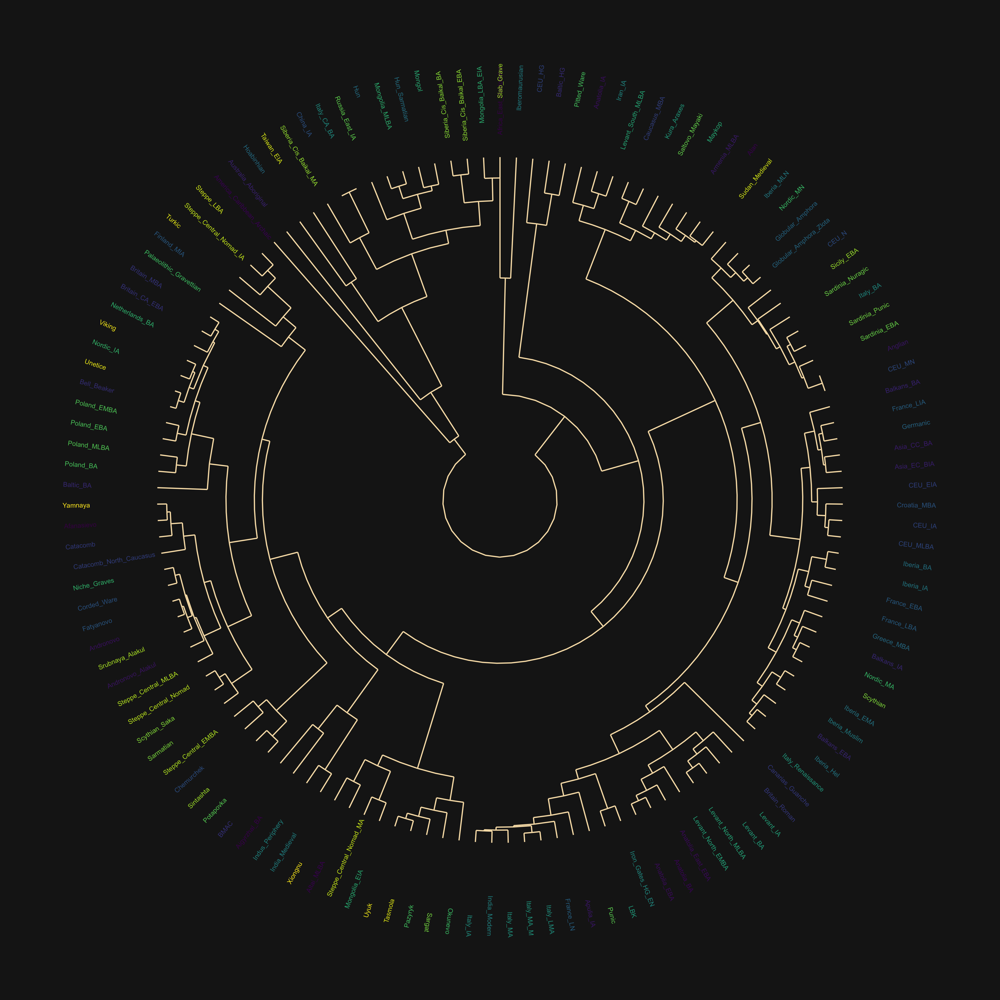

In [32]:
myfun(mydd[2:nrow(mydd),],2)

[1]  25 132
# A tibble: 6 × 132
  Afanasievo   Africa_East_Pastoralist Aigyrzhal_BA Alan         Altai_MLBA  
  <chr>        <chr>                   <chr>        <chr>        <chr>       
1 " 0.1274820" "-0.3386240"            " 0.0865060" " 0.1109775" " 0.0734160"
2 " 0.0832730" " 0.0883510"            " 0.0304660" " 0.1081540" "-0.1736555"
3 " 0.0384660" "-0.0199875"            "-0.0524200" "-0.0294155" " 0.0543055"
4 " 0.1043290" "-0.0625005"            " 0.0930240" "-0.0025840" " 0.0293930"
5 "-0.0273900" " 0.0032315"            "-0.0960180" "-0.0269280" "-0.0206195"
6 " 0.0398810" "-0.0340245"            " 0.0382080" " 0.0117135" " 0.0047410"
# ℹ 127 more variables: America_Caribbean_Archaic <chr>, Anatolia_BA <chr>,
#   Anatolia_EBA <chr>, Anatolia_East_EBA <chr>, Anatolia_IA <chr>,
#   Andronovo <chr>, Andronovo_Alakul <chr>, Anglian <chr>, Apulia_IA <chr>,
#   Armenia_MLBA <chr>, Asia_CC_BA <chr>, Asia_EC_BIA <chr>,
#   Australia_Aboriginal <chr>, BMAC <chr>, Balkans_BA <chr>,


x,y,xend,yend
<dbl>,<dbl>,<dbl>,<dbl>
66.641068,0.77335182,14.743073,0.77335182
14.743073,0.77335182,14.743073,0.64193417
14.743073,0.64193417,1.500000,0.64193417
1.500000,0.64193417,1.500000,0.32706793
1.500000,0.32706793,1.000000,0.32706793
1.000000,0.32706793,1.000000,0.00000000
1.500000,0.32706793,2.000000,0.32706793
2.000000,0.32706793,2.000000,0.00000000
14.743073,0.64193417,27.986145,0.64193417


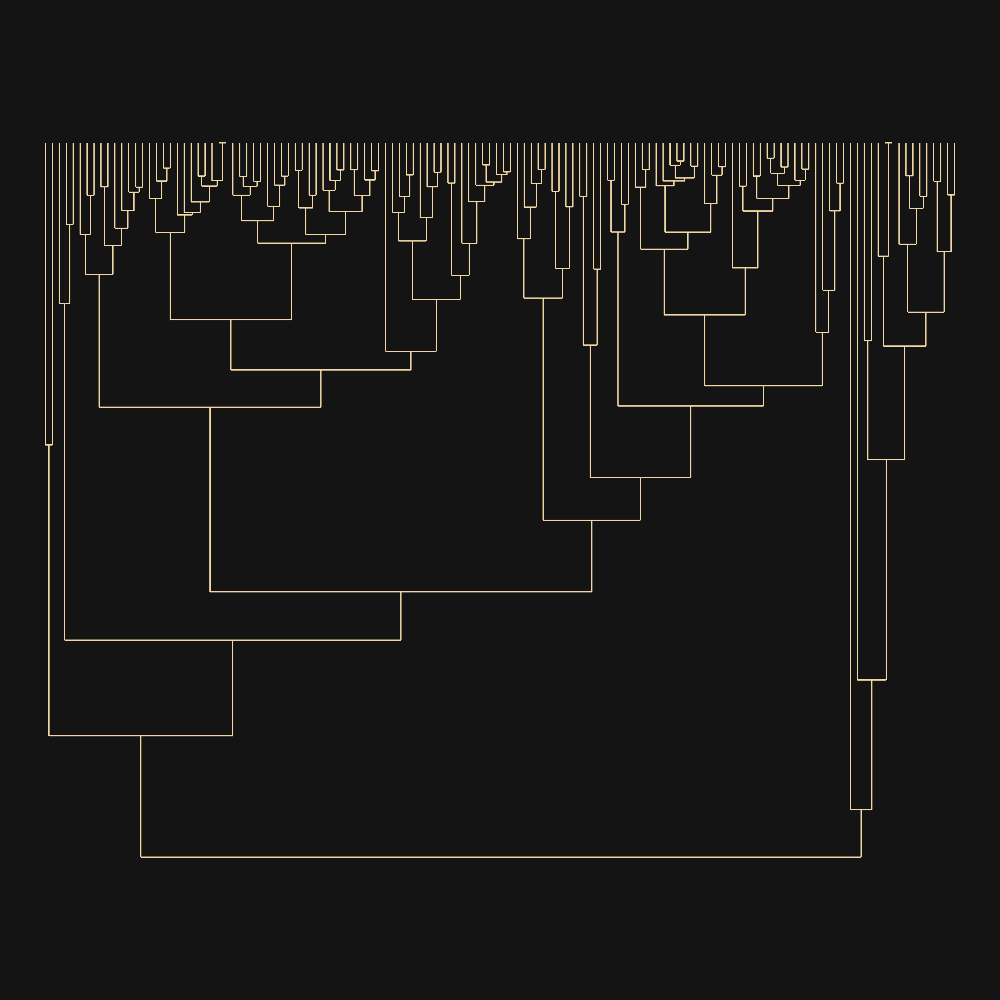

In [35]:
myfun(mydd[2:nrow(mydd),],2,FALSE)

In [36]:
colnames(myd)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Simplified_Culture" "Location"          
[34] "Country"            "Y-Symbol"           "YTree"             
[37] "yc"                 "y"

In [90]:
write_csv(myd %>% select(all_of(c("sample","desc","Simplified_Culture","Country","Location","y",paste0("V",2:26)))) %>% arrange(sample),"~/Documents/Ancestry/Raw Data/Archeological Samples/aDNA++.csv")

In [37]:
myd %>% count(Simplified_Culture,sort = TRUE) %>% head()

,Simplified_Culture,n
,<chr>,<int>
1,Viking,79
2,Bell_Beaker,22
3,Corded_Ware,14
4,Mongol,13
5,Italy_MA,12
6,Xiongnu,12


In [38]:
mavg = as_tibble(import("/Users/timoha/Documents/Ancestry/Genetics/G25/Data/TXT/Global25_PCA_modern_pop_averages_scaled.txt"))

In [39]:
mavg %>% sample_n(10)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Chamalin,0.1123745,0.1082924,-0.0248901,0.0117748,-0.0428051,0.0148065,0.0116652,-0.0032725,-0.0616546,⋯,-0.0023264,0.0040656,-0.0040194,-0.0058964,0.0038314,0.0013500,0.0027092,0.0080223,0.0097493,-0.0008711
Mayan,0.0567490,-0.2949387,0.1107659,0.0902554,-0.1048547,-0.0156974,-0.2758356,-0.3286347,-0.0140829,⋯,0.0037504,0.0079163,-0.0009773,-0.0013466,-0.0019474,-0.0026024,0.0056176,0.0010037,0.0000344,0.0003594
Greek_Izmir,0.1146199,0.1443068,-0.0024135,-0.0345287,0.0149874,-0.0126059,0.0025145,-0.0015000,-0.0022907,⋯,0.0001989,0.0107827,-0.0001141,0.0059203,-0.0030515,-0.0060393,0.0019289,0.0002095,0.0023496,-0.0030056
German_Hamburg,0.1282853,0.1339901,0.0634672,0.0485260,0.0400617,0.0203755,0.0075618,0.0091083,0.0029597,⋯,0.0032679,-0.0045558,0.0025562,0.0039926,0.0006842,0.0017395,0.0015566,0.0027185,0.0073504,-0.0010354
Saliya_Kerala,0.0443910,-0.0751490,-0.1644250,0.1052990,-0.0738600,0.0571730,-0.0007050,0.0177680,0.0370190,⋯,-0.0022540,-0.0026080,0.0017740,-0.0018850,-0.0003750,0.0082350,0.0000000,0.0038210,-0.0065070,0.0063470
Polish,0.1318405,0.1292694,0.0698685,0.0577382,0.0406754,0.0217127,0.0086781,0.0108626,-0.0009329,⋯,-0.0005595,0.0015455,-0.0000741,0.0026948,0.0012872,-0.0031286,-0.0031185,0.0056063,-0.0033328,-0.0000876
Brahmin_Uttar_Pradesh_East,0.0671557,-0.0287249,-0.1255811,0.1099131,-0.0729366,0.0631489,0.0006379,0.0081756,0.0258869,⋯,0.0006250,-0.0049920,0.0020630,-0.0039146,-0.0104693,-0.0019966,-0.0001060,0.0031164,0.0043723,-0.0076639
Aymara,0.0569120,-0.3127830,0.1191700,0.0930240,-0.1147910,-0.0145020,-0.3015190,-0.3592930,-0.0096130,⋯,0.0034470,0.0069100,0.0002530,-0.0017600,0.0025010,-0.0014970,0.0040810,0.0036970,0.0003610,-0.0075440
Palestinian_Beit_Sahour,0.0876435,0.1467440,-0.0541165,-0.0849490,-0.0156955,-0.0231480,-0.0054050,-0.0050765,0.0117600,⋯,0.0144525,0.0098440,0.0019635,-0.0001255,-0.0011255,-0.0016845,0.0038950,0.0035125,0.0053620,0.0033525


In [40]:
mavg = mydfun(mavg,"V1")

In [41]:
mavg %>% head(10)

Abazin,Abkhasian,Abkhasian_Gudauta,Adygei,Aeta,Afrikaner,Agta,Ahiska,Akha,Akhvakh,⋯,Yemenite_Mahra,Yi,Yoruba,Yugur,Yukagir_Forest,Yukagir_Tundra,Yukpa,Yuku,Zapotec,Zhuang
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Abazin,Abkhasian,Abkhasian_Gudauta,Adygei,Aeta,Afrikaner,Agta,Ahiska,Akha,Akhvakh,⋯,Yemenite_Mahra,Yi,Yoruba,Yugur,Yukagir_Forest,Yukagir_Tundra,Yukpa,Yuku,Zapotec,Zhuang
0.1079895,0.1092703,0.1109775,0.1128114,-0.0165040,0.1158925,-0.0210570,0.1115467,0.0163146,0.1166687,⋯,0.0542556,0.0201087,-0.6300625,0.0275310,0.0858226,0.0404072,0.0546350,0.0346022,0.0539522,0.0174529
0.0755300,0.1166731,0.1218635,0.1033583,-0.3330935,0.1294338,-0.3315700,0.1293107,-0.4336311,0.1068846,⋯,0.1360809,-0.4393857,0.0625011,-0.4163672,-0.1387214,-0.4049061,-0.3158300,-0.3748996,-0.2983626,-0.4492026
-0.0231456,-0.0478942,-0.0494025,-0.0297507,-0.0923945,0.0524198,-0.0956000,-0.0519170,-0.0206411,-0.0218100,⋯,-0.0682589,-0.0072910,0.0221130,0.0112194,0.1010680,0.1285711,0.1112510,0.0202640,0.1125328,-0.0364969
-0.0175631,-0.0406621,-0.0369835,-0.0192364,0.0332690,0.0390096,0.0342380,-0.0485577,-0.0504526,0.0188147,⋯,-0.1211978,-0.0485577,0.0167079,-0.0554349,0.0299098,-0.0016381,0.0994840,-0.0395244,0.0919258,-0.0660356
-0.0323136,-0.0389473,-0.0386225,-0.0334420,0.1041730,0.0370557,0.1044810,-0.0333393,0.0812767,-0.0406229,⋯,-0.0037272,0.0544713,0.0005035,0.0371222,-0.0431462,-0.1307937,-0.1110980,0.0104019,-0.1038348,0.1187230
0.0003835,-0.0065696,-0.0058565,-0.0020761,-0.0065540,0.0149967,-0.0139445,-0.0099470,0.0360884,0.0127360,⋯,-0.0563050,0.0194290,0.0124741,0.0147812,-0.0209168,-0.0729101,-0.0206380,0.0043972,-0.0159524,0.0559021
0.0081666,0.0113851,0.0110455,0.0091653,0.0023500,0.0038134,0.0001175,0.0050133,0.0008930,0.0052484,⋯,-0.0130301,0.0025850,-0.0444170,0.0064921,0.0127848,0.0043477,-0.3045740,0.0085464,-0.2672540,-0.0010575
-0.0031151,-0.0063329,-0.0042690,-0.0032051,-0.0139605,0.0064823,-0.0091150,-0.0066150,-0.0035383,-0.0025768,⋯,-0.0088204,-0.0001540,0.0477673,0.0017163,0.0231682,0.0111589,-0.3636770,0.0053614,-0.3242634,-0.0083203


[1]  25 856
# A tibble: 6 × 856
  Abazin   Abkhasian Abkhasian_Gudauta Adygei Aeta  Afrikaner Agta  Ahiska Akha 
  <chr>    <chr>     <chr>             <chr>  <chr> <chr>     <chr> <chr>  <chr>
1 " 0.107… " 0.1092… " 0.1109775"      " 0.1… "-0.… " 0.1158… "-0.… " 0.1… " 0.…
2 " 0.075… " 0.1166… " 0.1218635"      " 0.1… "-0.… " 0.1294… "-0.… " 0.1… "-0.…
3 "-0.023… "-0.0478… "-0.0494025"      "-0.0… "-0.… " 0.0524… "-0.… "-0.0… "-0.…
4 "-0.017… "-0.0406… "-0.0369835"      "-0.0… " 0.… " 0.0390… " 0.… "-0.0… "-0.…
5 "-0.032… "-0.0389… "-0.0386225"      "-0.0… " 0.… " 0.0370… " 0.… "-0.0… " 0.…
6 " 0.000… "-0.0065… "-0.0058565"      "-0.0… "-0.… " 0.0149… "-0.… "-0.0… " 0.…
# ℹ 847 more variables: Akhvakh <chr>, Alawite <chr>, Albanian <chr>,
#   Alevi_Dersim <chr>, Algerian <chr>, Altaian <chr>, Amerindian_North <chr>,
#   Ami <chr>, Andian_A <chr>, Andian_B <chr>, Arain <chr>,
#   Armenian_Aintab <chr>, Armenian_Ararat <chr>, Armenian_Artsakh <chr>,
#   Armenian_Erzurum <chr>, Armenian_

x,y,xend,yend
<dbl>,<dbl>,<dbl>,<dbl>
165.90388,1.10867401,47.85533,1.10867401
47.85533,1.10867401,47.85533,0.74460198
47.85533,0.74460198,15.96066,0.74460198
15.96066,0.74460198,15.96066,0.56918529
15.96066,0.56918529,4.59375,0.56918529
4.59375,0.56918529,4.59375,0.23305611
4.59375,0.23305611,1.50000,0.23305611
1.50000,0.23305611,1.50000,0.12127535
1.50000,0.12127535,1.00000,0.12127535


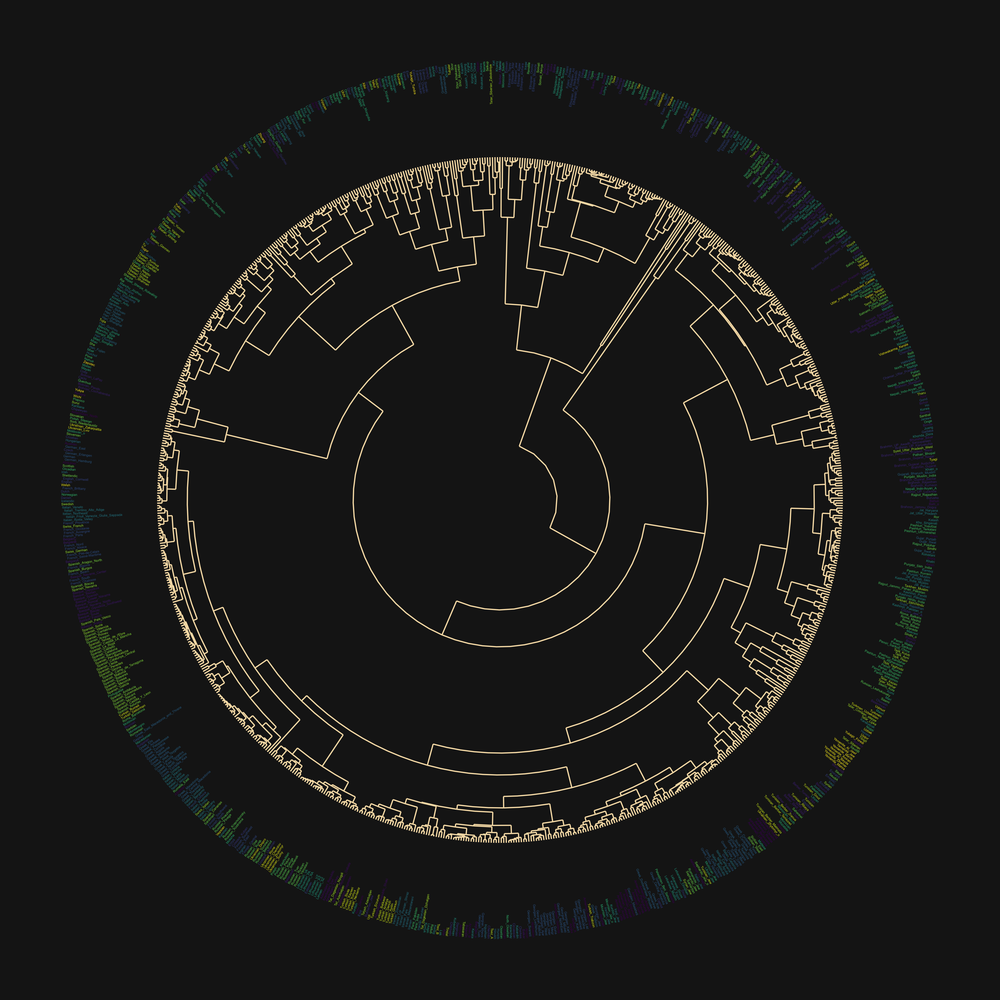

In [42]:
myfun(mavg[2:nrow(mavg),],1)